In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import sys
sys.path.append("..")

In [3]:
from IPython.display import clear_output
from src.dataset_loaders_new import get_samplers_toy, get_samplers_continuous_toy
from src.utils import get_pca_models
from src import utils
from src.train_final import train_toy_discrete, train_toy_continuous
import wandb
from torch.utils.data import TensorDataset, DataLoader
import yaml
import numpy as np
import random
import pickle
import matplotlib.pyplot as plt

## 1. Parameters.

Possible ```DATASET_NAME``` values are: ```twitter```, ```wiki-gigaword```, ```bone_marrow```

In [4]:
SOURCE_DIM   = 2  #38 (bone_marrow)
TARGET_DIM   = 3
MAX_ITERS    = 10000
TOY_TYPE     = f'toy_{SOURCE_DIM}d_{TARGET_DIM}d'
METHOD_NAME  = 'NeuralGW'
DEVICE       = 'cuda:0'
SEED         = 13
COST_DISCRETE= 'cosine'
N_CLUSTERS   = 10

config = {'dataset':dict(#DATASET_NAME         = DATASET_NAME,
                         DEVICE               = DEVICE,
                         TOY_TYPE             = TOY_TYPE,
                         SOURCE_DIM           = SOURCE_DIM,
                         TARGET_DIM           = TARGET_DIM,
                         BATCH_SIZE_TRAIN     = 2048,
                         N_CLUSTERS_SOURCE    = 10,
                         N_CLUSTERS_TARGET    = 10,
                         SEED                 = SEED,
                         TRAIN_TYPE           = 'continuous',
                         NORMALIZE_VECS       = False
                          ),
          
          #'training':dict(METHOD_NAME          = METHOD_NAME,
          #                MAX_ITERS            = MAX_ITERS,
          #                COST_DISCRETE        = COST_DISCRETE,
          #                EPS                  = 1e-3# AlignGW: 6e-4, FlowGW:1e-3, StructuredGW:
          #                )}

          'training':dict(METHOD_NAME          = METHOD_NAME,
                          N_EPOCHS             = 10000,
                          COST_DISCRETE        = COST_DISCRETE,
                          N_SAMPLES_PLOT       = 1024
                          ),

          
          #'model_specific':dict(COST_ITERS      = 1,
          #                      MOVER_ITERS     = 10,
          #                      CRITIC_ITERS    = 1,
          #                      REG_CRITIC      = 0.1,
          #                      COST_LR         = 1e-4,
          #                      MOVER_LR        = 1e-4, 
          #                      CRITIC_LR       = 1e-4,
          #                      HIDDEN_SIZES_MLP= [512, 512, 512, 512],)
           
         }



## 2. Loading dataset.

torch.Size([1024, 2])
torch.Size([1024, 3])


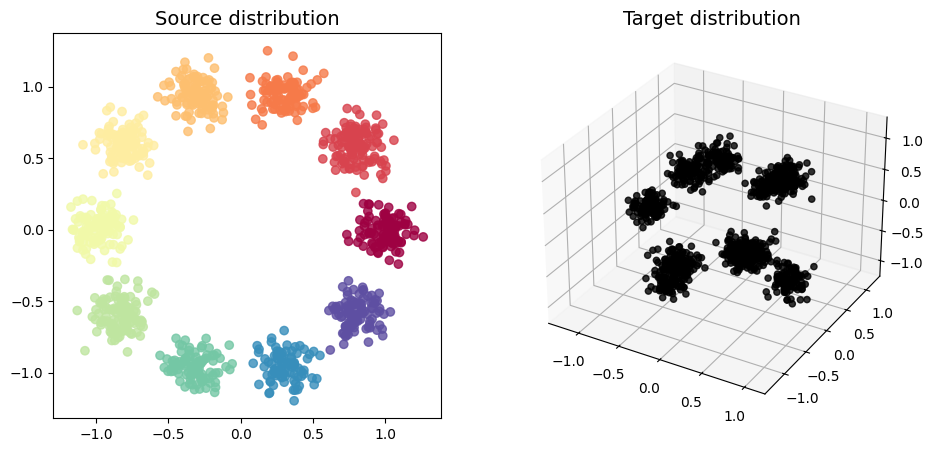

In [6]:

#train_sampler = get_samplers_toy(config)
#source_vectors, target_vectors, labels = train_sampler.sample(1024)

source_sampler, target_sampler = get_samplers_continuous_toy(config)
source_vectors, labels = source_sampler.sample_with_labels(1024)
target_vectors = target_sampler.sample(1024)

print(source_vectors.shape)
print(target_vectors.shape)

figure = plt.figure(figsize=(11,5))

if TOY_TYPE == 'toy_3d_2d':
    ax1 = figure.add_subplot(1, 2, 1, projection='3d')
    ax2 = figure.add_subplot(1, 2, 2, projection=None)
    
if TOY_TYPE == 'toy_2d_3d':
    ax1 = figure.add_subplot(1, 2, 1, projection=None)
    ax2 = figure.add_subplot(1, 2, 2, projection='3d')

ax1.scatter(*source_vectors.cpu().T, c=labels.cpu().numpy(), cmap="Spectral", alpha=.8)
ax1.set_title('Source distribution', fontsize=14)
ax2.scatter(*target_vectors.cpu().T, c='black', alpha=.8)
ax2.set_title('Target distribution', fontsize=14)

plt.show()

RuntimeError: Expected all tensors to be on the same device, but found at least two devices, cuda:0 and cpu! (when checking argument for argument tensors in method wrapper_CUDA_cat)

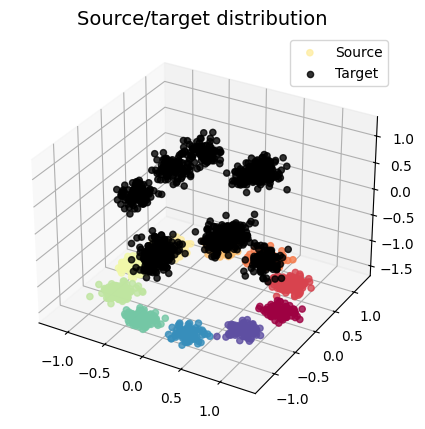

In [13]:
figure = plt.figure(figsize=(11,5))
ax1 = figure.add_subplot(1, 1, 1, projection='3d')

import torch
dis_tensor = torch.zeros((source_vectors.shape[0], 1)).to(torch.float32)-1.5
dis_tensor = dis_tensor.cpu()
source_vectors_projected = torch.cat((source_vectors.cpu(),dis_tensor), dim=1)

ax1.scatter(*source_vectors_projected.cpu().T, c=labels.cpu().numpy(), cmap="Spectral", alpha=.8, label='Source')
ax1.set_title('Source/target distribution', fontsize=14)
ax1.scatter(*target_vectors.cpu().T, c='black', alpha=.8, label='Target')
ax1.legend()
import torch
dis_tensor = torch.zeros((source_vectors.shape[0], 1)).to(torch.float32)-1.5
source_vectors_projected = torch.cat((source_vectors,dis_tensor), dim=1)
#ax1.set_title('Target distribution', fontsize=14)

plt.show()

## 3. Training.

Epoch:   0%|          | 0/10000 [00:00<?, ?it/s]

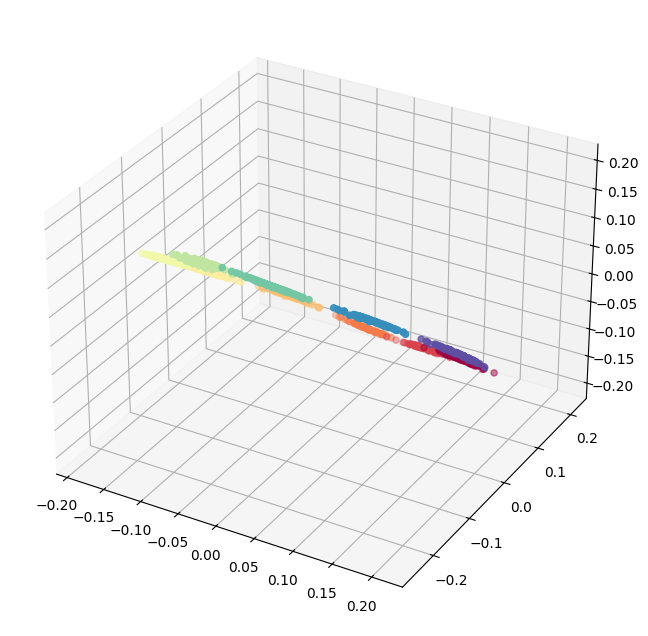

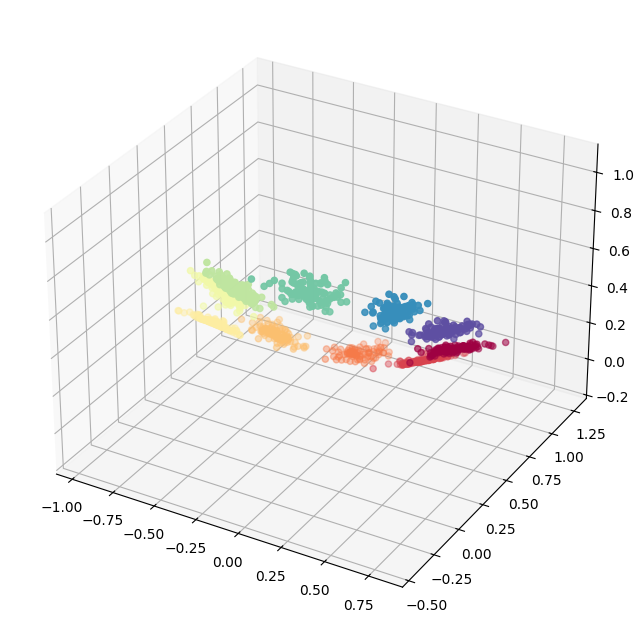

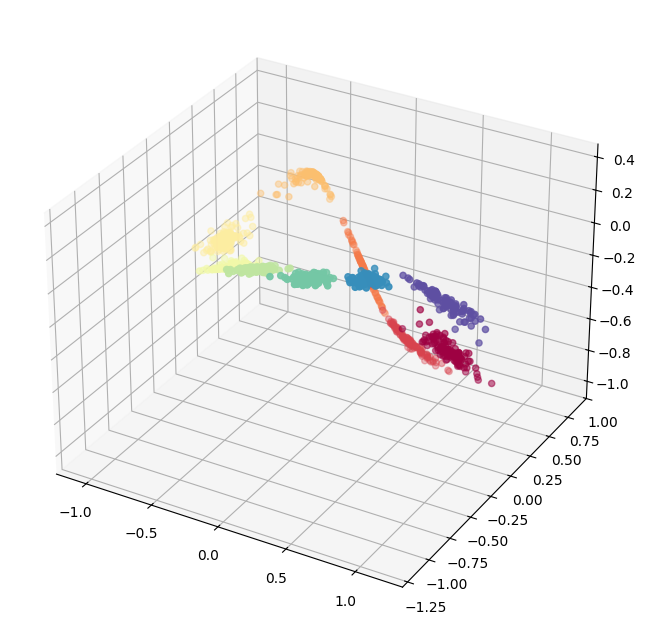

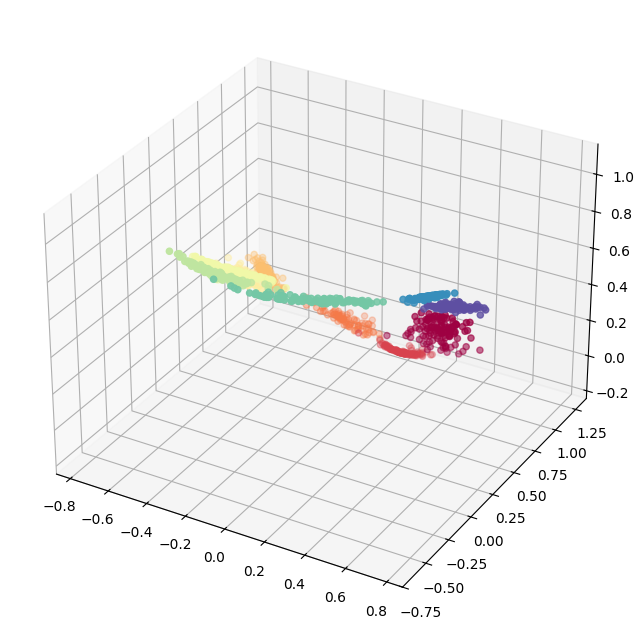

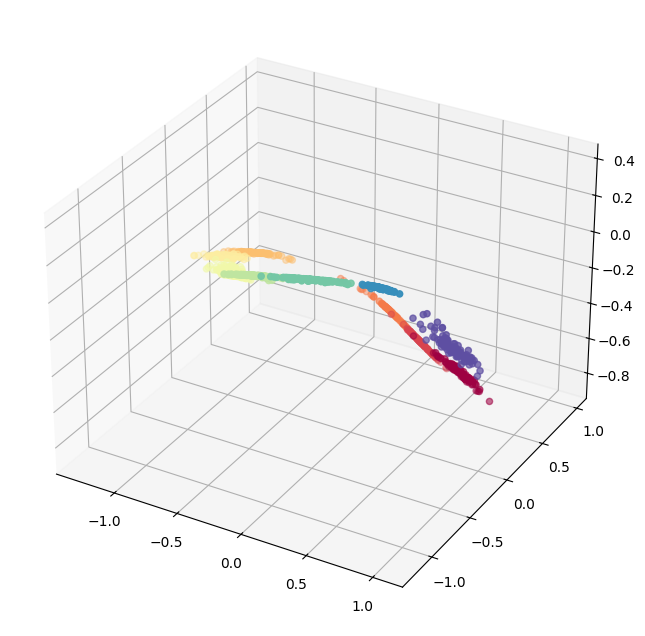

...

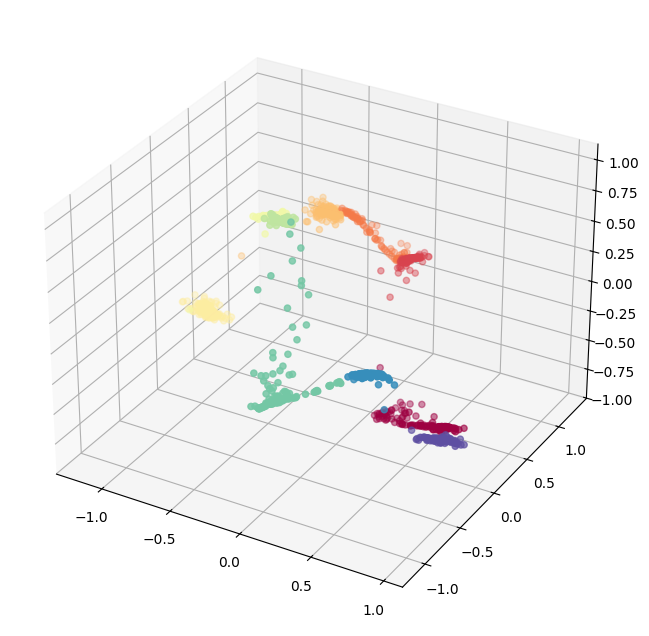

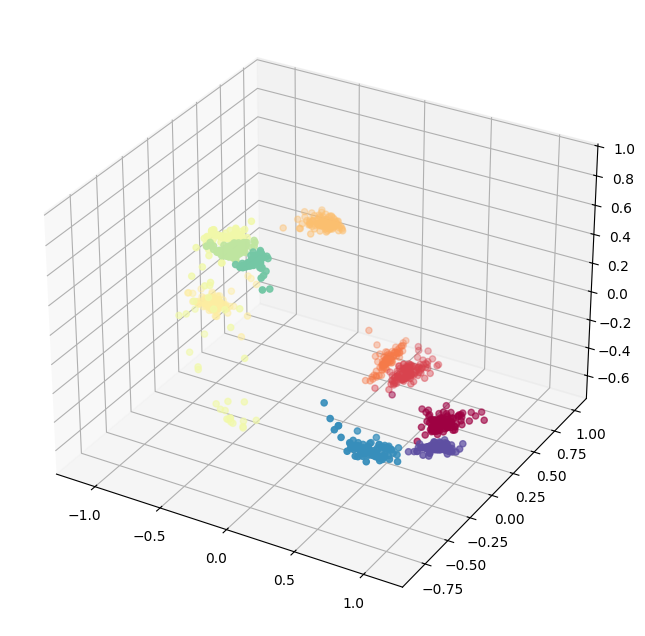

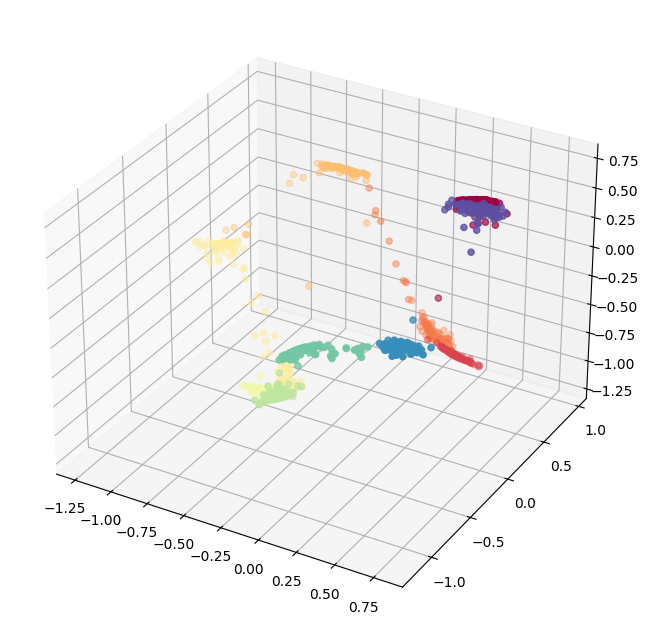

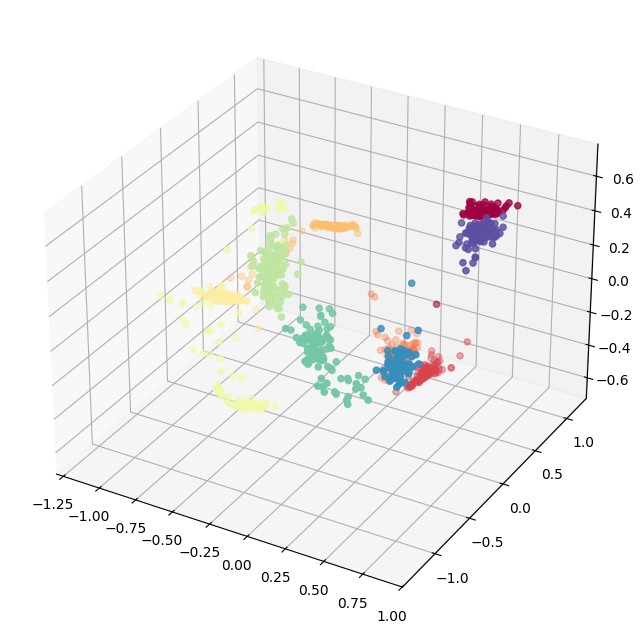

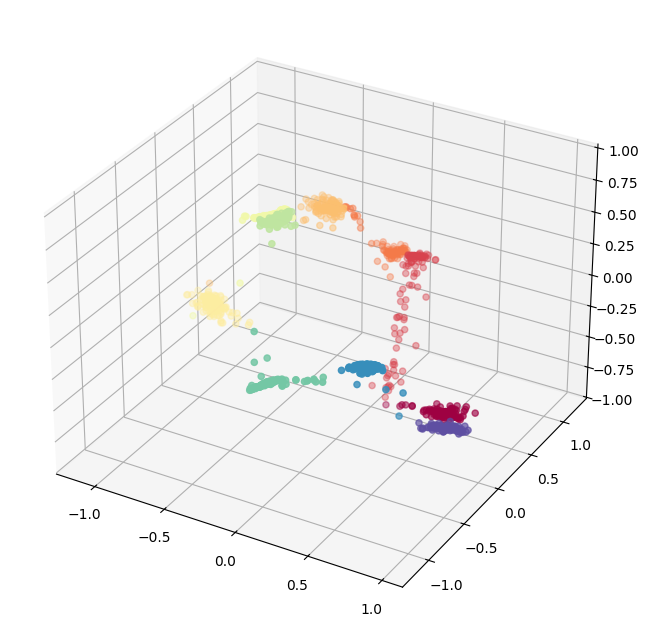

Interrumpting by keyboard...


In [15]:
trained_class = train_toy_continuous(source_sampler, target_sampler, 
                                     config, axis_lims=None, 
                                     report_every=100)